In [1]:
!kaggle datasets download -d farzadnekouei/pothole-image-segmentation-dataset

Dataset URL: https://www.kaggle.com/datasets/farzadnekouei/pothole-image-segmentation-dataset
License(s): apache-2.0
 86% 51.0M/59.3M [00:00<00:00, 64.0MB/s]
100% 59.3M/59.3M [00:01<00:00, 58.0MB/s]


In [2]:
!unzip ./pothole-image-segmentation-dataset.zip

Archive:  ./pothole-image-segmentation-dataset.zip
  inflating: Pothole_Segmentation_YOLOv8/README.dataset.txt  
  inflating: Pothole_Segmentation_YOLOv8/README.roboflow.txt  
  inflating: Pothole_Segmentation_YOLOv8/data.yaml  
  inflating: Pothole_Segmentation_YOLOv8/sample_video.mp4  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-1-_jpg.rf.49882cdb272111f43a6656b1494a4918.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-1-_jpg.rf.8d95dd1d29760a2634a45cc7fdd84b31.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-1-_jpg.rf.e238c9bf3fe82e8ac55b0014a27fc529.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-10-_jpg.rf.1d433d21e11d000b6b498eacb88fe4a9.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-10-_jpg.rf.500c683a687e403f4cdade4826a84b5b.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-10-_jpg.rf.5a901c212d899a7dc7dc78be7de892c0.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-100-_jpg

In [3]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 1.7 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
from ultralytics import YOLO
import cv2
from PIL import Image
import yaml
import random


In [5]:
dataDir = '/content/Pothole_Segmentation_YOLOv8/'

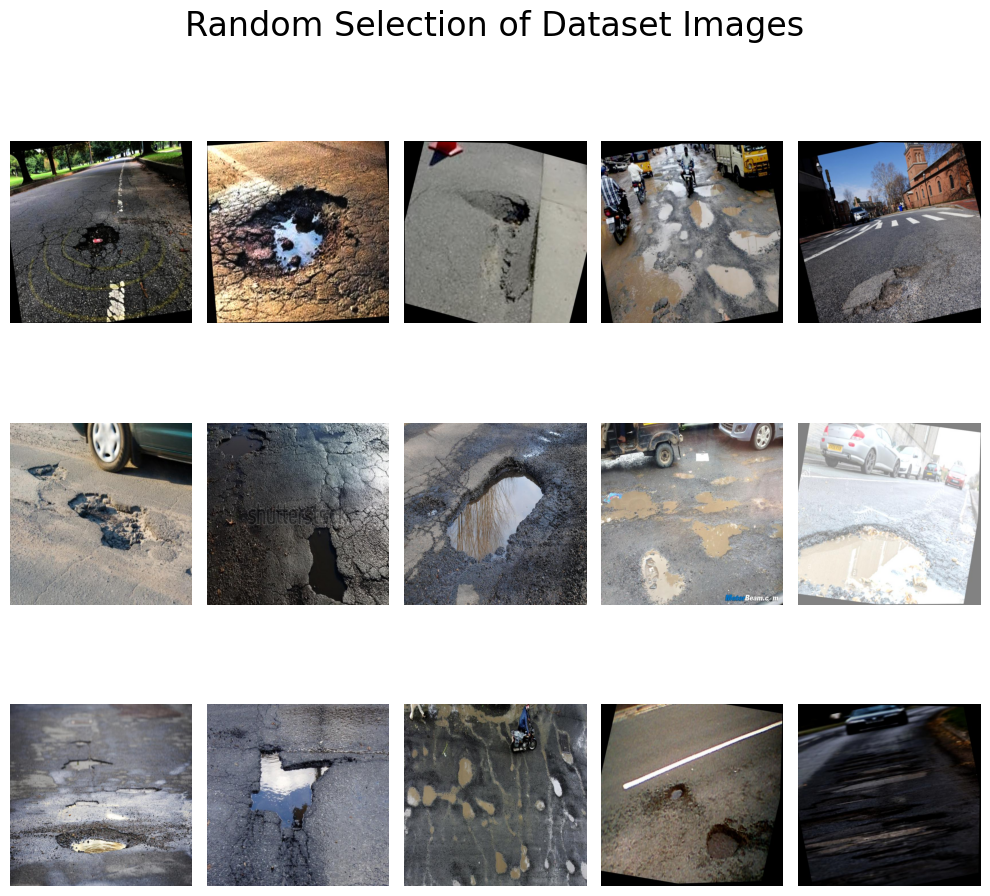

In [6]:
trainImagePath = os.path.join(dataDir, 'train','images')

#list of the images
imageFiles = [f for f in os.listdir(trainImagePath) if f.endswith('.jpg')]

randomImages = random.sample(imageFiles, 15)

plt.figure(figsize=(10, 10))

for i, image_file in enumerate(randomImages):

    image_path = os.path.join(trainImagePath, image_file)
    image = Image.open(image_path)
    plt.subplot(3, 5, i + 1)
    plt.imshow(image)
    plt.axis('off')

  # Add a suptitle
plt.suptitle('Random Selection of Dataset Images', fontsize=24)

# Show the plot
plt.tight_layout()
plt.show()

In [7]:
model = YOLO('yolov9c-seg.pt')

100%|██████████| 53.9M/53.9M [00:00<00:00, 228MB/s]


In [8]:
yamlFilePath = os.path.join(dataDir,'data.yaml' )

In [9]:
results = model.train(
    data= yamlFilePath,
    epochs=30,
    imgsz=512,
    batch=30,
    optimizer= 'AdamW',
    lr0=0.00001,              # Initial learning rate
    lrf=0.01,                # Final learning rate (lr0 * lrf)
    dropout=0.15,
    device=0,                # Device to run on, i.e. cuda device=0
    seed=42,

)

Ultralytics YOLOv8.2.79 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov9c-seg.pt, data=/content/Pothole_Segmentation_YOLOv8/data.yaml, epochs=30, time=None, patience=100, batch=30, imgsz=512, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.15, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=Tr

100%|██████████| 755k/755k [00:00<00:00, 22.1MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    212864  ultralytics.nn.modules.block.RepNCSPELAN4    [128, 256, 128, 64, 1]        
  3                  -1  1    164352  ultralytics.nn.modules.block.ADown           [256, 256]                    
  4                  -1  1    847616  ultralytics.nn.modules.block.RepNCSPELAN4    [256, 512, 256, 128, 1]       
  5                  -1  1    656384  ultralytics.nn.modules.block.ADown           [512, 512]                    
  6                  -1  1   2857472  ultralytics.nn.modules.block.RepNCSPELAN4    [512, 512, 512, 256, 1]       
  7                  -1  1    656384  ultralytics

100%|██████████| 6.25M/6.25M [00:00<00:00, 134MB/s]


AMP: checks passed ✅


train: Scanning /content/Pothole_Segmentation_YOLOv8/train/labels... 720 images, 0 backgrounds, 0 corrupt: 100%|██████████| 720/720 [00:01<00:00, 509.04it/s]

train: New cache created: /content/Pothole_Segmentation_YOLOv8/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/Pothole_Segmentation_YOLOv8/valid/labels... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<00:00, 304.07it/s]

val: New cache created: /content/Pothole_Segmentation_YOLOv8/valid/labels.cache


Plotting labels to runs/segment/train/labels.jpg... 
optimizer: AdamW(lr=1e-05, momentum=0.937) with parameter groups 163 weight(decay=0.0), 174 weight(decay=0.00046875), 173 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 2 dataloader workers
Logging results to runs/segment/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/30      15.1G      1.458      3.005       2.31      1.507        135        512: 100%|██████████| 24/24 [00:33<00:00,  1.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]

                   all         60        201      0.397      0.139      0.121     0.0517     0.0187     0.0547    0.00657    0.00242



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/30        15G      1.277      2.134        1.2       1.31        148        512: 100%|██████████| 24/24 [00:29<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]

                   all         60        201      0.493      0.259      0.327      0.176      0.303      0.149      0.125     0.0365



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/30      15.3G      1.183      1.974      1.031      1.246        165        512: 100%|██████████| 24/24 [00:29<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]

                   all         60        201      0.626      0.672      0.663        0.4       0.43      0.463      0.337      0.125



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/30      15.1G      1.132      1.865      0.962      1.229        142        512: 100%|██████████| 24/24 [00:29<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]

                   all         60        201      0.741      0.692      0.765      0.494      0.712      0.667      0.708      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/30      15.1G      1.095      1.825     0.9093      1.209        126        512: 100%|██████████| 24/24 [00:30<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]

                   all         60        201      0.681      0.711      0.767      0.504      0.719      0.697      0.768      0.463



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/30      15.2G      1.098       1.83     0.9036      1.199        138        512: 100%|██████████| 24/24 [00:30<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]

                   all         60        201       0.72      0.721      0.753      0.479      0.723      0.701      0.757       0.45



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/30      15.2G      1.076      1.762     0.8496      1.181        172        512: 100%|██████████| 24/24 [00:30<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]

                   all         60        201      0.767      0.692      0.759      0.491      0.766      0.692      0.762      0.465



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/30      15.1G      1.065      1.703     0.7947       1.17        132        512: 100%|██████████| 24/24 [00:30<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]

                   all         60        201       0.71      0.711      0.767      0.493      0.707      0.726      0.768      0.475



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/30      15.3G      1.023      1.687     0.7511      1.151        122        512: 100%|██████████| 24/24 [00:29<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]

                   all         60        201      0.684      0.766      0.773        0.5      0.692      0.776      0.777      0.476



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/30      15.1G      1.046      1.685     0.7528      1.155        178        512: 100%|██████████| 24/24 [00:30<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]

                   all         60        201      0.687      0.776      0.781      0.505      0.775      0.692      0.789      0.484



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/30      15.2G      1.035      1.664     0.7322      1.154        126        512: 100%|██████████| 24/24 [00:29<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]

                   all         60        201       0.68      0.729      0.762      0.498      0.712      0.736      0.775      0.482



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/30      15.1G     0.9933      1.645     0.7124      1.123        144        512: 100%|██████████| 24/24 [00:29<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]

                   all         60        201      0.681      0.746      0.778      0.502      0.695      0.761      0.798      0.481



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/30      15.3G      1.009      1.618     0.7006       1.14        120        512: 100%|██████████| 24/24 [00:29<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]

                   all         60        201      0.761      0.679      0.773        0.5      0.771      0.688      0.776      0.481



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/30      15.1G     0.9622       1.59     0.6786      1.111        133        512: 100%|██████████| 24/24 [00:29<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]

                   all         60        201      0.788      0.686      0.777      0.499      0.804      0.692      0.786      0.478



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/30      15.3G     0.9695      1.603     0.6668      1.116        132        512: 100%|██████████| 24/24 [00:30<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]

                   all         60        201      0.703      0.726       0.78      0.496      0.718      0.733      0.786      0.471



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/30      15.1G     0.9847      1.573     0.6777      1.119        110        512: 100%|██████████| 24/24 [00:29<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]

                   all         60        201      0.741      0.741      0.769      0.493      0.751      0.751      0.784      0.466



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/30      15.2G     0.9548      1.533      0.642      1.115        123        512: 100%|██████████| 24/24 [00:29<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]

                   all         60        201      0.763      0.706      0.785      0.513      0.774      0.716      0.794      0.479



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/30      15.2G     0.9456      1.525     0.6253      1.104        127        512: 100%|██████████| 24/24 [00:29<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]

                   all         60        201      0.784      0.711      0.781      0.505      0.795      0.721      0.793      0.471



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/30      15.3G     0.9531      1.544     0.6375      1.104        146        512: 100%|██████████| 24/24 [00:29<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]

                   all         60        201      0.733      0.716      0.778        0.5      0.743      0.726      0.793      0.475



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/30      15.2G     0.9376      1.538     0.6255      1.107        100        512: 100%|██████████| 24/24 [00:30<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]

                   all         60        201      0.796      0.682      0.789      0.505      0.802      0.686      0.793      0.482


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/30      15.1G     0.9301      1.518     0.5747      1.084         77        512: 100%|██████████| 24/24 [00:31<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]

                   all         60        201      0.754      0.692      0.776      0.504      0.794      0.682      0.788      0.466



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/30      15.1G     0.9034      1.482       0.53      1.074         61        512: 100%|██████████| 24/24 [00:29<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]

                   all         60        201       0.78      0.706      0.797      0.518      0.791      0.716      0.807      0.493



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/30      15.2G     0.8834      1.469     0.5102      1.056         65        512: 100%|██████████| 24/24 [00:29<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]

                   all         60        201      0.829      0.676      0.797      0.517      0.847       0.69      0.821      0.491



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/30        15G     0.8707      1.442     0.4949      1.048         71        512: 100%|██████████| 24/24 [00:30<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]

                   all         60        201      0.763      0.721      0.804      0.512      0.776      0.741      0.816      0.491



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/30      15.1G     0.8902      1.452     0.4985      1.064         95        512: 100%|██████████| 24/24 [00:30<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]

                   all         60        201      0.754      0.726      0.807      0.513       0.76      0.736       0.82      0.492



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/30      15.1G     0.8632       1.41     0.4877      1.048         62        512: 100%|██████████| 24/24 [00:29<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]

                   all         60        201      0.757      0.726      0.807      0.519      0.763      0.746      0.825      0.498



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/30      15.1G      0.872      1.433     0.4834      1.059         68        512: 100%|██████████| 24/24 [00:29<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]

                   all         60        201      0.759      0.721      0.806      0.518      0.769      0.731      0.816      0.492



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/30      15.1G     0.8678      1.437     0.4921      1.049         49        512: 100%|██████████| 24/24 [00:29<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]

                   all         60        201      0.725      0.751      0.806      0.523      0.735      0.761      0.815      0.496



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/30      15.1G     0.8569      1.423     0.4796       1.04         73        512: 100%|██████████| 24/24 [00:29<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]

                   all         60        201      0.733      0.756      0.807      0.522      0.738      0.761      0.813      0.494



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/30        15G     0.8453      1.401     0.4764      1.038         79        512: 100%|██████████| 24/24 [00:29<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]

                   all         60        201      0.731      0.756      0.806      0.521      0.736      0.761      0.813      0.495



30 epochs completed in 0.282 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 56.2MB
Optimizer stripped from runs/segment/train/weights/best.pt, 56.2MB

Validating runs/segment/train/weights/best.pt...
Ultralytics YOLOv8.2.79 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c-seg summary (fused): 411 layers, 27,625,299 parameters, 0 gradients, 157.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


                   all         60        201      0.757      0.726      0.807      0.519      0.763      0.746      0.825      0.498
Speed: 0.1ms preprocess, 13.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/segment/train


In [11]:
bestModelpath = '/content/runs/segment/train/weights/best.pt'
bestModel = YOLO(bestModelpath)


image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-192-_jpg.rf.e0b55409488785e7156677026d372c23.jpg: 640x640 2 Potholes, 69.1ms
Speed: 1.7ms preprocess, 69.1ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-36-_jpg.rf.13a668c4003681c4631508465eef5a9f.jpg: 640x640 9 Potholes, 68.9ms
Speed: 1.5ms preprocess, 68.9ms inference, 5.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-152-_jpg.rf.510fb0040c8523bb66ec10b0fe67b4b4.jpg: 640x640 20 Potholes, 68.9ms
Speed: 1.6ms preprocess, 68.9ms inference, 9.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-28-_jpg.rf.fe8316c392940899d9211be3305c9ab6.jpg: 640x640 2 Potholes, 44.6ms
Speed: 1.4ms preprocess, 44.6ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLO

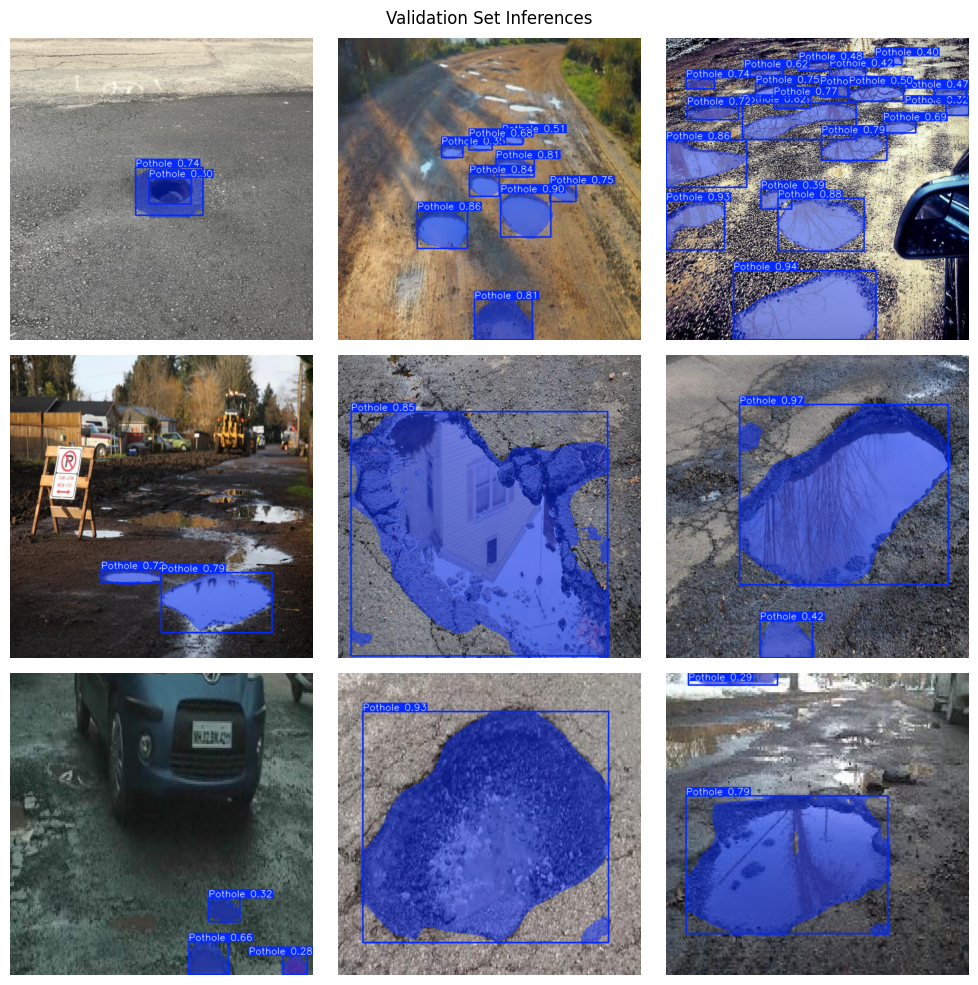

In [26]:
validImagePath = os.path.join(dataDir, 'valid', 'images')

imageFiles = [f for f in os.listdir(validImagePath) if f.endswith('.jpg')]

#select Random images
numImages = len(imageFiles)
selectedImage = [imageFiles[i] for i in range(0, numImages, numImages // 18)]

fig, axes = plt.subplots(3, 3, figsize=(10, 10))
fig.suptitle('Validation Set Inferences')

for i, ax in enumerate(axes.flatten()):
  imagePath = os.path.join(validImagePath, selectedImage[i])
  results = bestModel.predict(source= imagePath, imgsz=640)
  annotatedImage = results[0].plot()
  annotatedImageRGB = cv2.cvtColor(annotatedImage, cv2.COLOR_BGR2RGB)
  ax.imshow(annotatedImageRGB)
  ax.axis('off')

plt.tight_layout()
plt.show()

## **Make the Inference on video**

In [27]:
import shutil
videoPath = '/content/Pothole_Segmentation_YOLOv8/sample_video.mp4'

bestModel.predict(source=videoPath, save=True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 288x512 5 Potholes, 110.3ms
video 1/1 (frame 2/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 288x512 4 Potholes, 31.8ms
video 1/1 (frame 3/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 288x512 4 Potholes, 33.1ms
video 1/1 (frame 4/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 288x512 4 Potholes, 29.3ms
video 1/1 (frame 5/375) /conten

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: ultralytics.engine.results.Masks object
 names: {0: 'Pothole'}
 obb: None
 orig_img: array([[[146, 137, 129],
         [177, 168, 160],
         [178, 169, 161],
         ...,
         [246, 243, 244],
         [246, 243, 244],
         [246, 243, 244]],
 
        [[197, 188, 180],
         [206, 197, 189],
         [164, 155, 147],
         ...,
         [246, 243, 244],
         [246, 243, 244],
         [246, 243, 244]],
 
        [[150, 141, 133],
         [183, 174, 166],
         [188, 179, 171],
         ...,
         [246, 243, 244],
         [246, 243, 244],
         [246, 243, 244]],
 
        ...,
 
        [[ 80,  92, 102],
         [ 70,  82,  92],
         [ 63,  75,  85],
         ...,
         [ 61,  81, 101],
         [ 62,  82, 102],
         [ 65,  85, 105]],
 
        [[ 70,  82,  92],
         [ 63,  75,  85],
         [ 59,  71,  8

In [29]:
import subprocess

# Convert AVI to MP4 using FFmpeg
subprocess.call(['ffmpeg', '-y', '-loglevel', 'panic', '-i', '/content/runs/segment/predict/sample_video.avi', 'output_video.mp4'])

from IPython.display import Video

# Display the converted MP4 video
Video("output_video.mp4", embed=True, width=960)